In [ ]:
import torch 
import torch.nn as nn
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np 
import math
from torchvision import datasets

batch_size = 25

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


Data path

In [ ]:
# remove the files
#shutil.rmtree('gender_and_age')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
path_p = 'drive/MyDrive/Proyectos/data/data'

##Preprocessing

In [ ]:
import shutil
import os

gender_and_age = ['fm', 'fo', 'fy', 'mm', 'mo', 'my']
gender_and_age_label = ['female and middle-age', 'female and old', 'female and young', 'male and middle-age', 'male and old', 'male and young']
files = ['gender_and_age']

for i in files:
 os.mkdir(i)

for i in gender_and_age:
  os.mkdir(files[0] + '/' + i)

out = os.listdir(path_p)

for i in out:
  shutil.copy2(path_p + '/' + i, files[0] + '/' + i[6] + i[4])


FileExistsError: ignored

In [ ]:
all_paths = []
for i in os.listdir('gender_and_age/'):
  for j in os.listdir('gender_and_age/' + i):
    all_paths.append('gender_and_age/' + i + '/' + j)
all_paths.sort()

In [ ]:
!pip install mtcnn

In [ ]:
from mtcnn import MTCNN
from PIL import Image
from PIL import ImageFile
#ImageFile.LOAD_TRUNCATED_IMAGES = True
import numpy as np

In [ ]:
# Cut the photo
def extract_face(filename, final_file, required_size=(255, 255)):
  image = Image.open(filename)
  image = image.resize((255, 255)) 
  image = image.convert('RGB')
  pixels = np.asarray(image)
  detector = MTCNN() # create the detector, using default weights
  results = detector.detect_faces(pixels) # detect faces in the image
  x1, y1, width, height = results[0]['box']
  x1, y1 = abs(x1), abs(y1)
  x2, y2 = x1 + width, y1 + height
  face = pixels[y1:y2, x1:x2]
  image = Image.fromarray(face)
  image = image.resize(required_size)
  
  face_array = np.asarray(image)
  img = Image.fromarray(face_array, 'RGB')
  img.save(final_file)
  return face_array

In [ ]:
os.mkdir('gender_and_age_cut')
for i in gender_and_age:
  os.mkdir('gender_and_age_cut' + '/' + i)

In [ ]:
path = 'gender_and_age_cut'
for i in all_paths:
  extract_face(i, path + '/' + i[15:17] + '/' +i[19:])

# Processing

## Architecture

In [ ]:
#hypengrparameter 
learning_rate =  0.001

class CNN(nn.Module):
    def __init__(self, num_classes=2):
        super(CNN, self).__init__()
        self.layer1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer2 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.Dropout(0.35),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer3 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.Dropout(0.35),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer4 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.layer5 = nn.Sequential(
            nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))
        self.fc = nn.Sequential(
            nn.Linear(1568, 64),
            nn.ReLU(),
            nn.Linear(64, num_classes))
        
        #self.fc = nn.Linear(256, num_classes)
    def forward(self, x):
        out = self.layer1(x)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = self.layer5(out)
        out = out.reshape(out.size(0), -1)
        out = self.fc(out)
        return out


### Train function

In [ ]:
def train(model, optimizer, loos_fn, num_epochs):
  loss_vals = []
  running_loss =0.0
  # train the model
  total_step = len(train_loader)

  list_loss= []
  list_time = []
  j=0

  for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):
      images = images.to(device)
      labels = labels.to(device)
      # forward 
      output = model(images)
      loss   = loss_fn(output, labels)
      # change the params
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      list_loss.append(loss.item())
      list_time.append(j)
      j+=1
              
      if (i+1) % 2 == 0:
              print ('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}' 
                    .format(epoch+1, num_epochs, i+1, total_step, loss.item()))
    if (epoch+1) % 4 == 0:
      a = test(model)
    if loss.item() < 0.11:
      break
  print('Finished Training Trainset')
  return list_loss

### Test function

In [ ]:
def test(model):
  with torch.no_grad():
      correct = 0
      total = 0
      for images, labels in test_loader:
          images = images.to(device)
          labels = labels.to(device)
          outputs = model(images)
          _, predicted = torch.max(outputs.data, 1)
          total += labels.size(0)
          correct += (predicted == labels).sum().item()
      print('Test Accuracy: {} %'.format(100 * correct / total))

###Otras funciones

In [ ]:
def Show_imgs(imgs, name,  size = 3, color = True):
  color_m ='jet'
  if color == False:
    color_m ='gray'
  print('******************' + name  +  '**************************')
  img_numbers = imgs.shape[0]
  rows = cols = math.ceil(np.sqrt(img_numbers))
  
  fig = plt.figure(figsize=(rows*size, cols*size))
  for i in range(0, rows*cols):
    fig.add_subplot(rows, cols,i+1)
    if i<img_numbers:
      plt.imshow(imgs[i].detach(), cmap = 'gray')
  plt.show()


In [ ]:
def Show(out, title = ''):
  print(title)
  out = out.permute(1,0,2,3)
  grilla = torchvision.utils.make_grid(out)
  plt.imshow(transforms.ToPILImage()(grilla), 'jet')
  plt.show()

def Show_Weight(out):
  grilla = torchvision.utils.make_grid(out)
  plt.imshow(transforms.ToPILImage()(grilla), 'jet')
  plt.show()

Softm = torch.nn.Softmax()

#Experimentation

In [ ]:
import random
random.seed(50)

In [ ]:
#dataset = torchvision.datasets.ImageFolder('gender_and_age/', transform = transforms.Compose([transforms.Resize(255),  transforms.CenterCrop(255),  transforms.ToTensor()])
from torchvision.utils import save_image
dataset = torchvision.datasets.ImageFolder('gender_and_age_cut/',
                                           transform = transforms.Compose([transforms.Resize(255),  
                                                                           transforms.CenterCrop(255),
                                                                           transforms.ColorJitter(brightness=0.4, contrast= 0.9),
                                                                           transforms.ToTensor()])) 
#dataloader = torch.utils.data.DataLoader(dataset, batch_size=25, shuffle=False)
len_data = len(dataset)
num_classes = 6
proportion = 70
min_train = 7

a = True
label_list = []
count_list = []
attemps = 0
while (a):
  label_list = []
  count_list = []
  train_set, test_set = torch.utils.data.random_split(dataset, [int(len_data*proportion/100),len_data - int(len_data*proportion/100)])
  for i in train_set:
    label_list = label_list + [i[1]]
  for j in range(num_classes):
    count_list = count_list + [label_list.count(j)]
  contador = 0
  for k in count_list:
    if k > min_train:
      contador = contador + 1
  if contador >= num_classes:
    a = False
  attemps = attemps +1
print(count_list, " - ", attemps)
train_loader = torch.utils.data.DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_set, batch_size=batch_size, shuffle=False)


[8, 8, 9, 9, 8, 8]  -  76


In [ ]:
print(len(train_set))
print(len(test_set))
print(train_set[0])

50
22
(tensor([[[0.5843, 0.5882, 0.5882,  ..., 0.6314, 0.6588, 0.6784],
         [0.6118, 0.6078, 0.6039,  ..., 0.6353, 0.6549, 0.6627],
         [0.6039, 0.6000, 0.5961,  ..., 0.6471, 0.6627, 0.6667],
         ...,
         [0.1686, 0.1686, 0.1686,  ..., 0.2510, 0.3765, 0.4667],
         [0.1686, 0.1686, 0.1686,  ..., 0.2980, 0.4392, 0.5176],
         [0.1686, 0.1686, 0.1686,  ..., 0.3255, 0.4588, 0.5412]],

        [[0.5725, 0.5686, 0.5686,  ..., 0.5608, 0.5922, 0.6078],
         [0.5961, 0.5922, 0.5882,  ..., 0.5647, 0.5882, 0.5961],
         [0.5882, 0.5843, 0.5804,  ..., 0.5804, 0.5961, 0.6000],
         ...,
         [0.1647, 0.1647, 0.1647,  ..., 0.1922, 0.3373, 0.4275],
         [0.1647, 0.1647, 0.1647,  ..., 0.2392, 0.3843, 0.4824],
         [0.1647, 0.1647, 0.1647,  ..., 0.2549, 0.4039, 0.5020]],

        [[0.5176, 0.5176, 0.5176,  ..., 0.4941, 0.5216, 0.5412],
         [0.5451, 0.5412, 0.5373,  ..., 0.4980, 0.5176, 0.5294],
         [0.5373, 0.5333, 0.5294,  ..., 0.5098, 0.5

******************Image # 0**************************


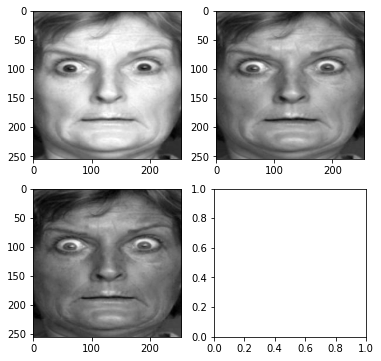

In [ ]:
img, label = train_set[14]
Show_imgs(img, "Image # " + str(label))

In [ ]:
model         = CNN(num_classes).to(device)
loss_fn       = nn.CrossEntropyLoss()
optimizer     = torch.optim.Adam(model.parameters(), lr = learning_rate)

print([ e.shape  for e in model.fc.parameters()])

model.fc[0].weight


[torch.Size([64, 1568]), torch.Size([64]), torch.Size([6, 64]), torch.Size([6])]


Parameter containing:
tensor([[-0.0052, -0.0209,  0.0090,  ..., -0.0120, -0.0243, -0.0251],
        [-0.0087,  0.0108, -0.0249,  ...,  0.0209, -0.0229,  0.0048],
        [ 0.0114,  0.0159,  0.0215,  ...,  0.0179, -0.0077, -0.0165],
        ...,
        [-0.0021, -0.0143,  0.0029,  ...,  0.0250, -0.0162, -0.0016],
        [ 0.0127,  0.0207,  0.0150,  ...,  0.0017,  0.0198, -0.0051],
        [-0.0066, -0.0167,  0.0120,  ...,  0.0229,  0.0087,  0.0062]],
       device='cuda:0', requires_grad=True)

In [ ]:
model.to('cuda')
lost_list_b = train(model,optimizer,loss_fn,40)

Epoch [1/40], Step [2/2], Loss: 1.7936
Epoch [2/40], Step [2/2], Loss: 1.7988
Epoch [3/40], Step [2/2], Loss: 1.7943
Epoch [4/40], Step [2/2], Loss: 1.7884
Test Accuracy: 22.727272727272727 %
Epoch [5/40], Step [2/2], Loss: 1.7825
Epoch [6/40], Step [2/2], Loss: 1.7577
Epoch [7/40], Step [2/2], Loss: 1.7619
Epoch [8/40], Step [2/2], Loss: 1.8277
Test Accuracy: 31.818181818181817 %
Epoch [9/40], Step [2/2], Loss: 1.6777
Epoch [10/40], Step [2/2], Loss: 1.5493
Epoch [11/40], Step [2/2], Loss: 1.4959
Epoch [12/40], Step [2/2], Loss: 1.3968
Test Accuracy: 54.54545454545455 %
Epoch [13/40], Step [2/2], Loss: 1.4069
Epoch [14/40], Step [2/2], Loss: 1.2001
Epoch [15/40], Step [2/2], Loss: 1.2033
Epoch [16/40], Step [2/2], Loss: 1.0487
Test Accuracy: 72.72727272727273 %
Epoch [17/40], Step [2/2], Loss: 0.8675
Epoch [18/40], Step [2/2], Loss: 0.9709
Epoch [19/40], Step [2/2], Loss: 0.9863
Epoch [20/40], Step [2/2], Loss: 1.3966
Test Accuracy: 72.72727272727273 %
Epoch [21/40], Step [2/2], Loss:

In [ ]:
model.to('cuda')
test(model)

Test Accuracy: 86.36363636363636 %


[]

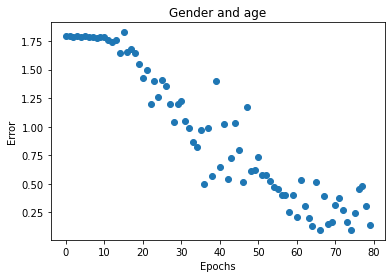

In [ ]:
plt.scatter(range(len(lost_list_b)), lost_list_b)
plt.title("Gender and age")
plt.xlabel("Epochs")
plt.ylabel("Error")
plt.plot()

[]

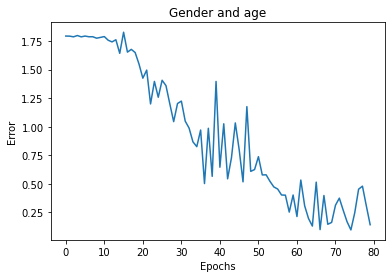

In [ ]:
plt.plot( range(len(lost_list_b)), lost_list_b)
plt.title("Gender and age")
plt.xlabel("Epochs")
plt.ylabel("Error")
plt.plot()

Prediction and label:  tensor([1])  -  1
layer 1: Convolution output


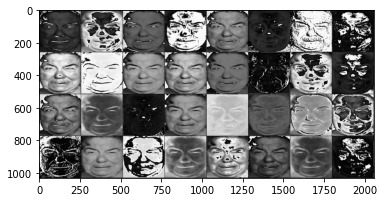

layer 1: Activation function output


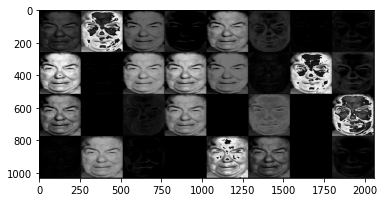

layer 1: Max-Pooling


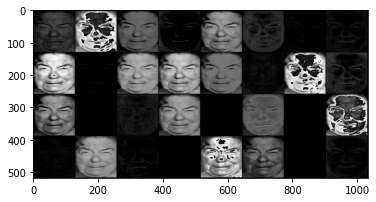

layer 2: Convolution output


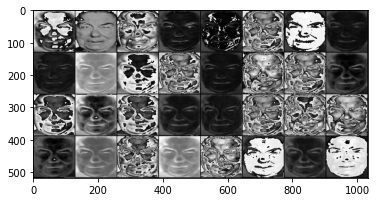

layer 2: Activation function output


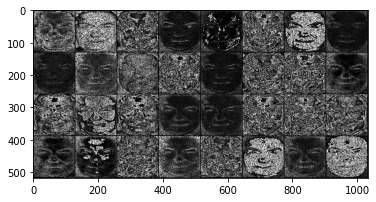

layer 2: Max-Pooling


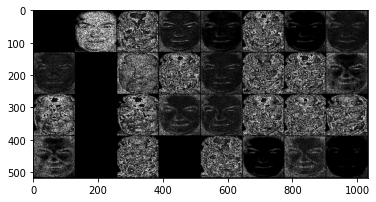

layer 3: Convolution output


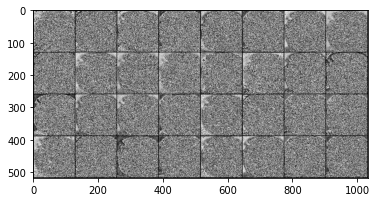

layer 3: Activation function output


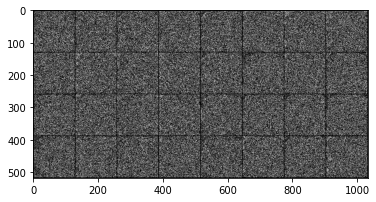

layer 3: Max-Pooling


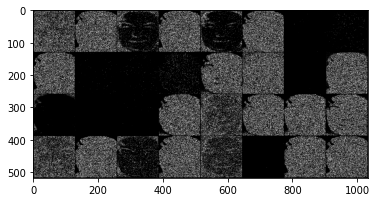

layer 4: Convolution output


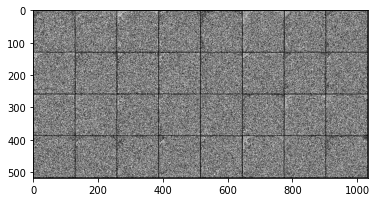

layer 4: Activation function output


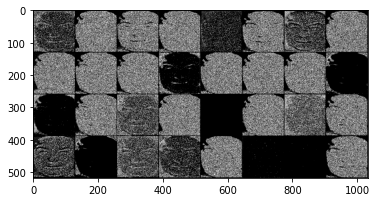

layer 4: Max-Pooling


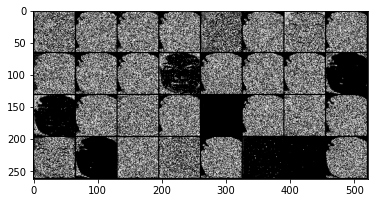

layer 5: Convolution output


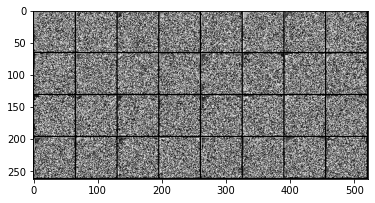

layer 5: Activation function output


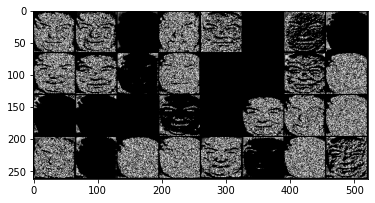

layer 5: Max-Pooling


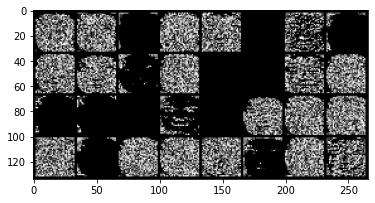

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


Prediction is { tensor([22676]) } and label is { 1 }
******************test n° 6**************************


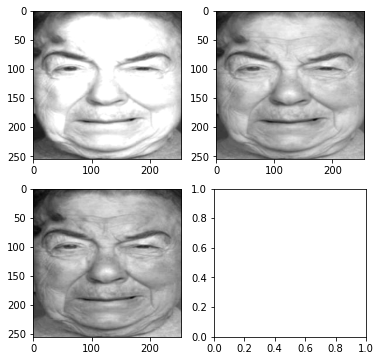

In [ ]:
n_test = 6

with torch.no_grad():
  model.to('cpu')
  img, label = test_set[n_test]
  img = img.unsqueeze(0)
  out = model(img)
  _, predicted = torch.max(out.data, 1)
  print ('Prediction and label: ',predicted,' - ', label)
  
  out = model.layer1[0](img)
  Show(out, 'layer 1: Convolution output')
  out = model.layer1[1](out)
  Show(out, 'layer 1: Activation function output')
  out = model.layer1[2](out)
  Show(out, 'layer 1: Max-Pooling')
  
  
  out = model.layer2[0](out)
  Show(out, 'layer 2: Convolution output')
  out = model.layer2[1](out)
  Show(out, 'layer 2: Activation function output')
  out = model.layer2[2](out)
  Show(out, 'layer 2: Max-Pooling')

  out = model.layer3[0](out)
  Show(out, 'layer 3: Convolution output')
  out = model.layer3[1](out)
  Show(out, 'layer 3: Activation function output')
  out = model.layer3[2](out)
  Show(out, 'layer 3: Max-Pooling')

  out = model.layer4[0](out)
  Show(out, 'layer 4: Convolution output')
  out = model.layer4[1](out)
  Show(out, 'layer 4: Activation function output')
  out = model.layer4[2](out)
  Show(out, 'layer 4: Max-Pooling')

  out = model.layer5[0](out)
  Show(out, 'layer 5: Convolution output')
  out = model.layer5[1](out)
  Show(out, 'layer 5: Activation function output')
  out = model.layer5[2](out)
  Show(out, 'layer 5: Max-Pooling')

  out = out.reshape(out.size(0), -1)
  out = Softm(out)
  img, label = test_set[n_test]
  name_of_test ="test n° " + str(n_test)

 # print('Gender and age group: ',gender_and_age_label[torch.max(out.data, 1)[1]],'.')
  print('Prediction is {',torch.max(out.data, 1)[1],'} and label is {',label,'}')


  Show_imgs(img, name_of_test)

#Validar image

In [ ]:
# filename is in new_test
def validar_imagen(filename):
  os.mkdir('new_test_tmp')
  os.mkdir('new_test_tmp/0')
  extract_face('new_test/'+ filename,'new_test_tmp/0/' + filename)
  exotic_set = torchvision.datasets.ImageFolder('new_test_tmp/',
                        transform = transforms.Compose([transforms.Resize(255),  
                                                                           transforms.CenterCrop(255),
                                                                           #transforms.ColorJitter(brightness=0.4, contrast= 0.8),
                                                                           transforms.ToTensor()])) 
  n_test = 0
  dataset_to_process = exotic_set
  if torch.no_grad():
    model.to('cpu')
    img, label = dataset_to_process[n_test]
    img = img.unsqueeze(0)
    out = model(img)
    _, predicted = torch.max(out.data, 1)
    print ('Prediction and label: ',predicted,' - ', label)
    
    out = model.layer1[0](img)
    Show(out, 'layer 1: Convolution output')
    out = model.layer1[1](out)
    Show(out, 'layer 1: Activation function output')
    out = model.layer1[2](out)
    Show(out, 'layer 1: Max-Pooling')
    
    
    out = model.layer2[0](out)
    Show(out, 'layer 2: Convolution output')
    out = model.layer2[1](out)
    out = model.layer2[2](out)
    Show(out, 'layer 2: Activation function output')
    out = model.layer2[3](out)
    Show(out, 'layer 2: Max-Pooling')

    out = model.layer3[0](out)
    Show(out, 'layer 3: Convolution output')
    out = model.layer3[1](out)
    out = model.layer3[2](out)
    Show(out, 'layer 3: Activation function output')
    out = model.layer3[3](out)
    Show(out, 'layer 3: Max-Pooling')

    out = model.layer4[0](out)
    Show(out, 'layer 4: Convolution output')
    out = model.layer4[1](out)
    Show(out, 'layer 4: Activation function output')
    out = model.layer4[2](out)
    Show(out, 'layer 4: Max-Pooling')

    out = model.layer5[0](out)
    Show(out, 'layer 5: Convolution output')
    out = model.layer5[1](out)
    Show(out, 'layer 5: Activation function output')
    out = model.layer5[2](out)
    Show(out, 'layer 5: Max-Pooling')

    out = out.reshape(out.size(0), -1)
    out = model.fc(out)
    print(out)
    out = Softm(out)
    img, label = dataset_to_process[n_test]
    name_of_test ="test "
    Show_imgs(img, name_of_test)
    print('Gender and age group: ',gender_and_age_label[torch.max(out.data, 1)[1]],'.')
    print('Prediction is {',torch.max(out.data, 1)[1],'} and label is {',label,'}')

  shutil.rmtree('new_test_tmp')

Prediction and label:  tensor([5])  -  0
layer 1: Convolution output


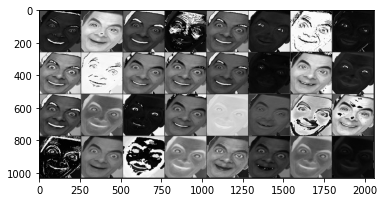

layer 1: Activation function output


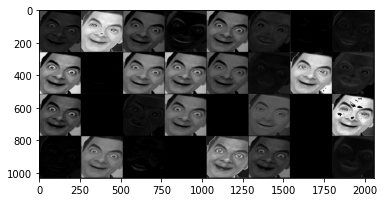

layer 1: Max-Pooling


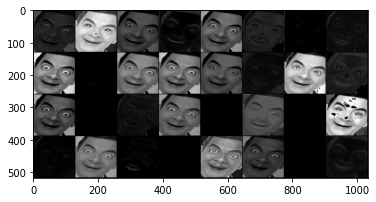

layer 2: Convolution output


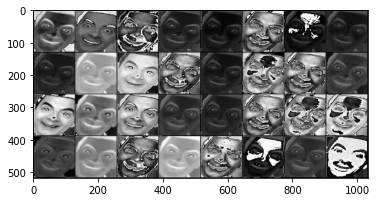

layer 2: Activation function output


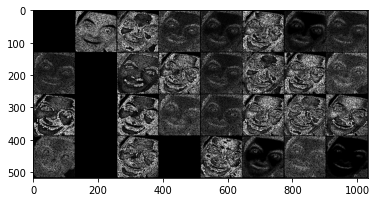

layer 2: Max-Pooling


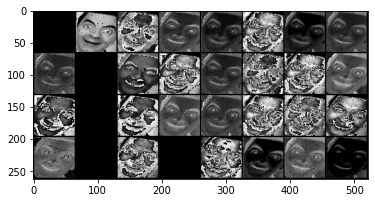

layer 3: Convolution output


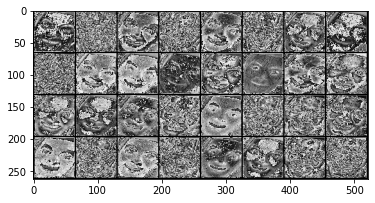

layer 3: Activation function output


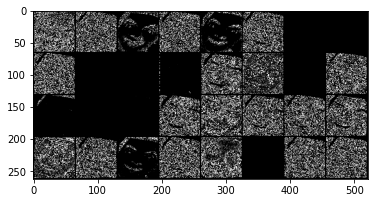

layer 3: Max-Pooling


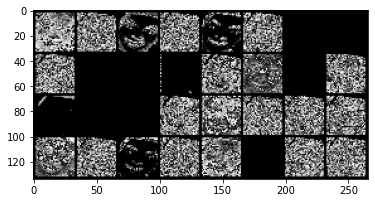

layer 4: Convolution output


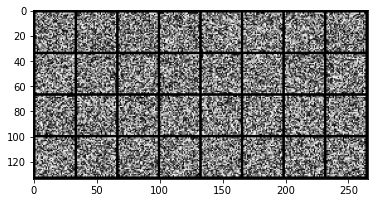

layer 4: Activation function output


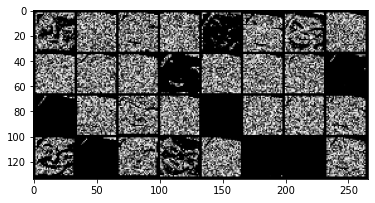

layer 4: Max-Pooling


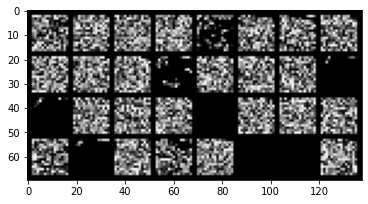

layer 5: Convolution output


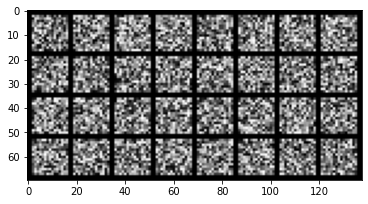

layer 5: Activation function output


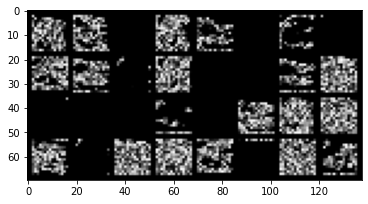

layer 5: Max-Pooling


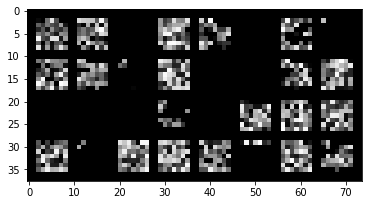

tensor([[-3.5547,  7.4695, -0.9880,  1.2790,  1.2647,  8.2772]],
       grad_fn=<AddmmBackward0>)
******************test **************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


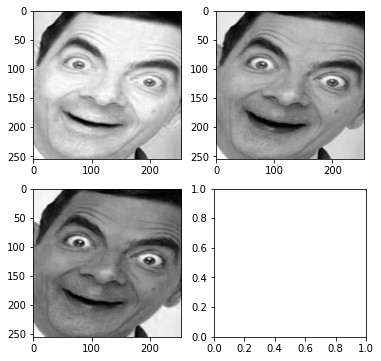

Gender and age group:  male and young .
Prediction is { tensor([5]) } and label is { 0 }


In [ ]:
validar_imagen('img1.jpg')

Prediction and label:  tensor([2])  -  0
layer 1: Convolution output


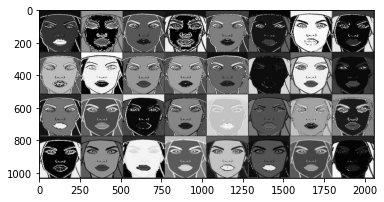

layer 1: Activation function output


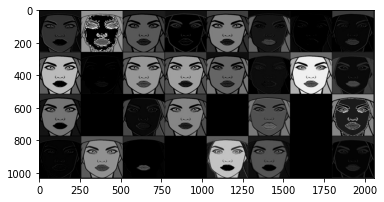

layer 1: Max-Pooling


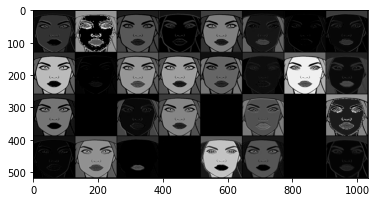

layer 2: Convolution output


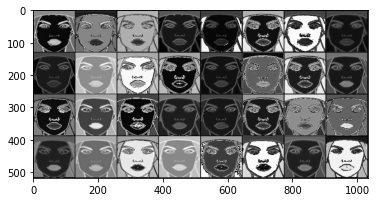

layer 2: Activation function output


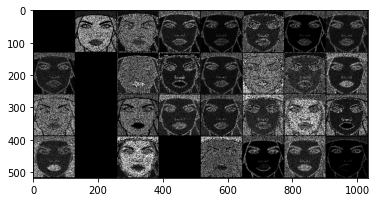

layer 2: Max-Pooling


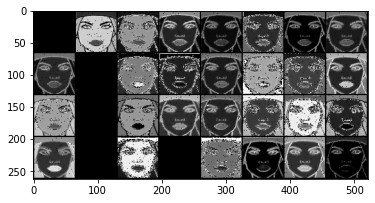

layer 3: Convolution output


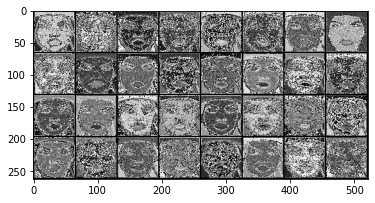

layer 3: Activation function output


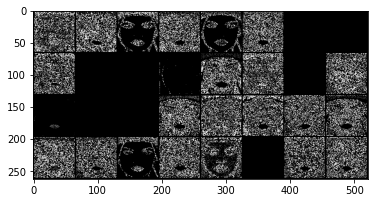

layer 3: Max-Pooling


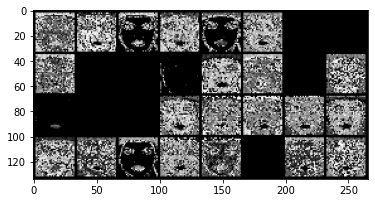

layer 4: Convolution output


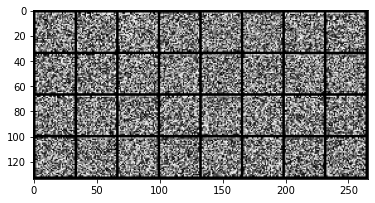

layer 4: Activation function output


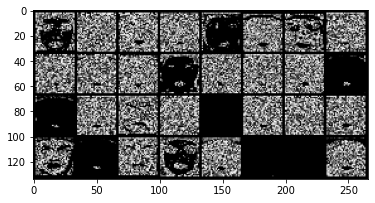

layer 4: Max-Pooling


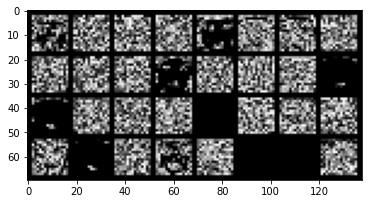

layer 5: Convolution output


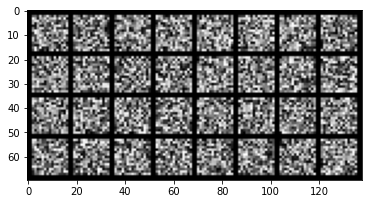

layer 5: Activation function output


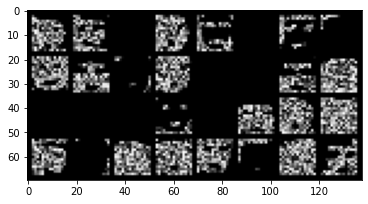

layer 5: Max-Pooling


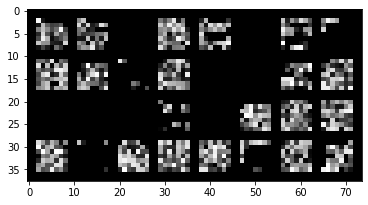

tensor([[  8.4753,  11.3127,  12.4774,  -6.2352, -28.1950,   9.1400]],
       grad_fn=<AddmmBackward0>)
******************test **************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


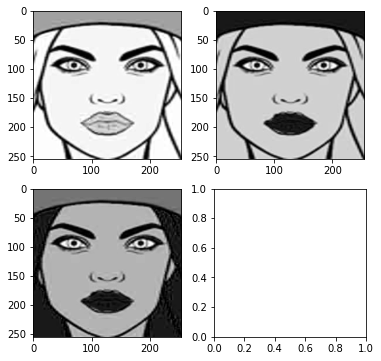

Gender and age group:  female and young .
Prediction is { tensor([2]) } and label is { 0 }


In [ ]:
validar_imagen('img2.jpg')

Prediction and label:  tensor([1])  -  0
layer 1: Convolution output


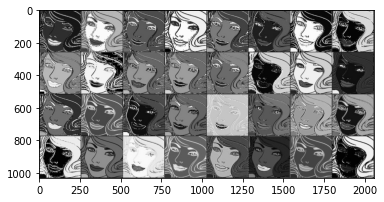

layer 1: Activation function output


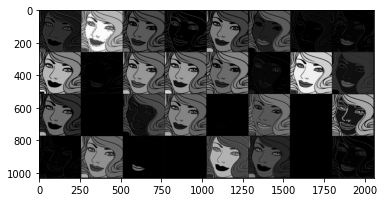

layer 1: Max-Pooling


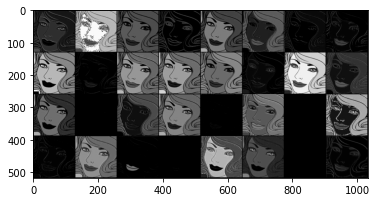

layer 2: Convolution output


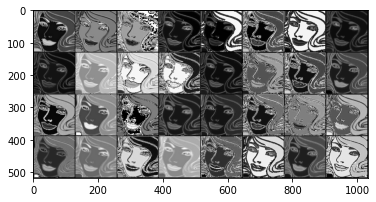

layer 2: Activation function output


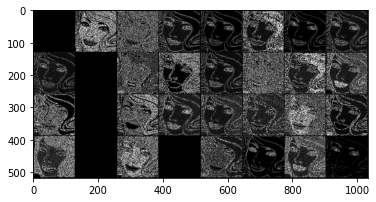

layer 2: Max-Pooling


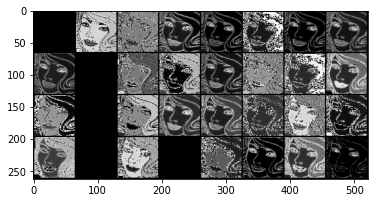

layer 3: Convolution output


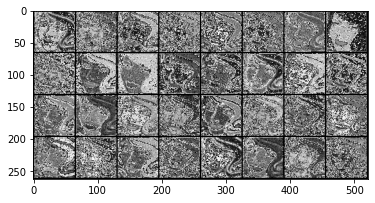

layer 3: Activation function output


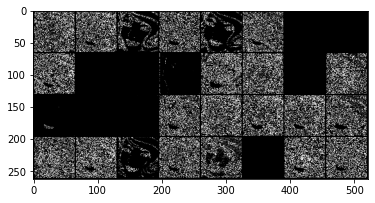

layer 3: Max-Pooling


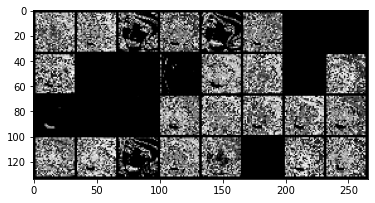

layer 4: Convolution output


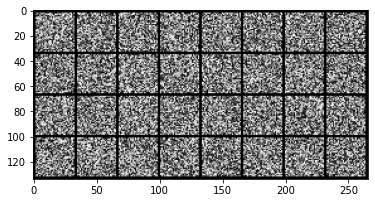

layer 4: Activation function output


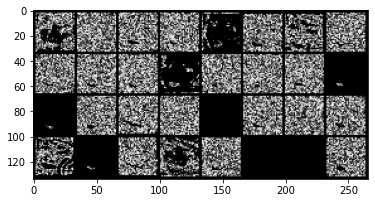

layer 4: Max-Pooling


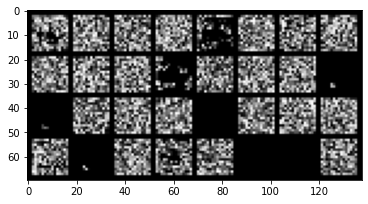

layer 5: Convolution output


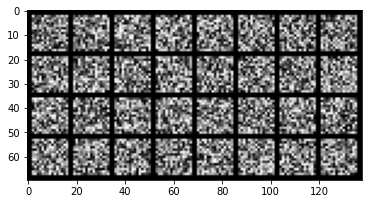

layer 5: Activation function output


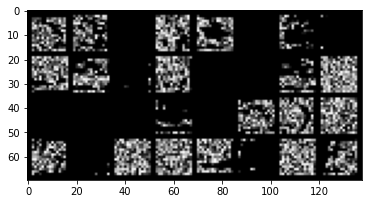

layer 5: Max-Pooling


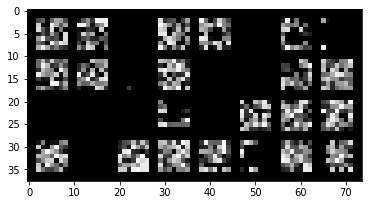

tensor([[  0.1275,  13.2046,   4.4119,   5.0921, -15.2696,   5.6093]],
       grad_fn=<AddmmBackward0>)
******************test **************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


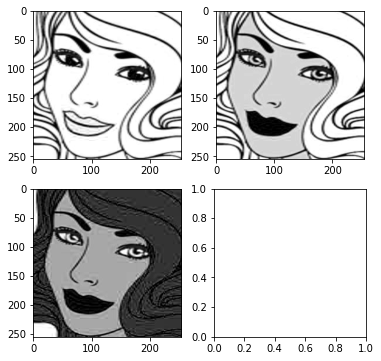

Gender and age group:  female and old .
Prediction is { tensor([1]) } and label is { 0 }


In [ ]:
validar_imagen('img3.jpg')

Prediction and label:  tensor([1])  -  0
layer 1: Convolution output


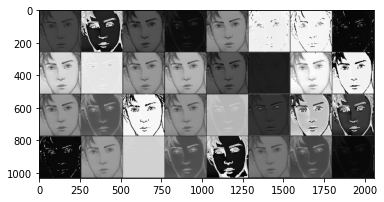

layer 1: Activation function output


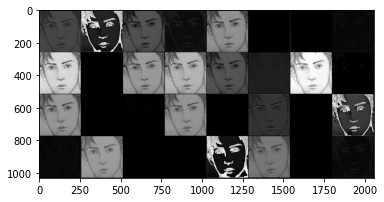

layer 1: Max-Pooling


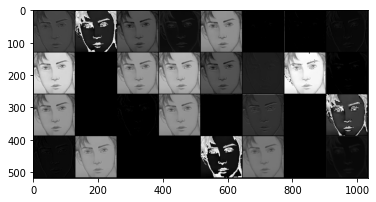

layer 2: Convolution output


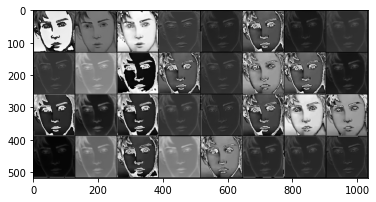

layer 2: Activation function output


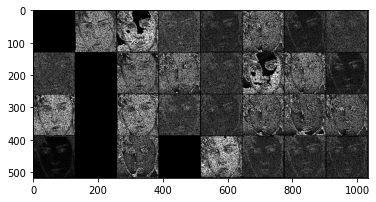

layer 2: Max-Pooling


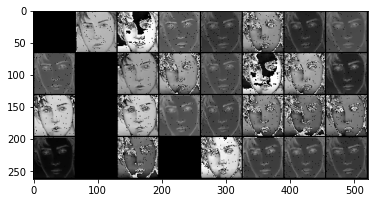

layer 3: Convolution output


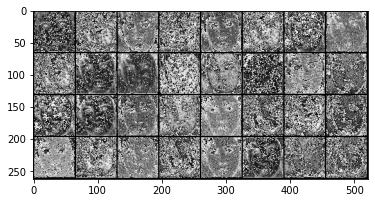

layer 3: Activation function output


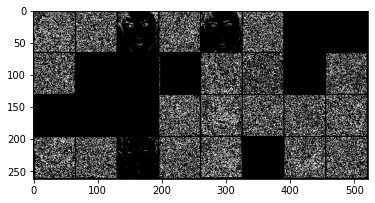

layer 3: Max-Pooling


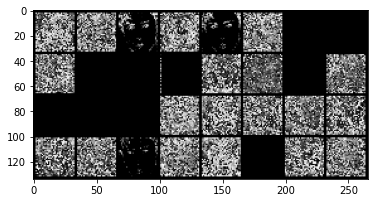

layer 4: Convolution output


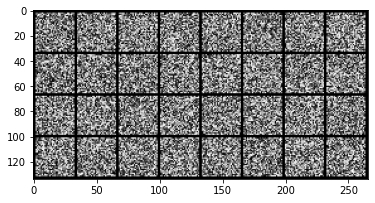

layer 4: Activation function output


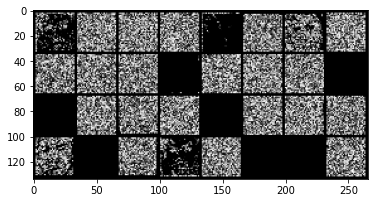

layer 4: Max-Pooling


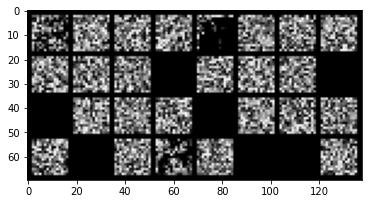

layer 5: Convolution output


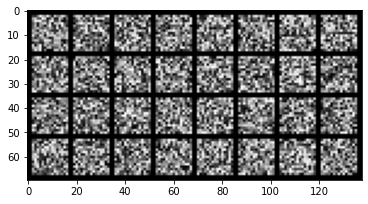

layer 5: Activation function output


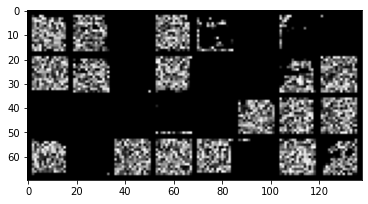

layer 5: Max-Pooling


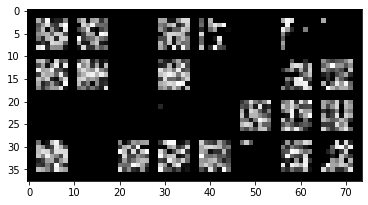

tensor([[-4.1069, 16.4157, -1.1123,  8.1167, -5.4405,  6.1996]],
       grad_fn=<AddmmBackward0>)
******************test **************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


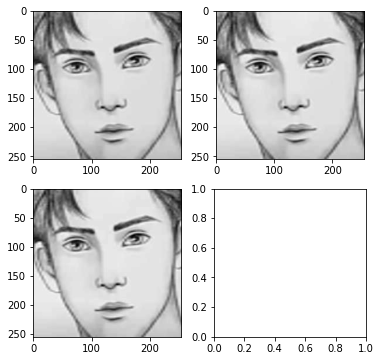

Gender and age group:  female and old .
Prediction is { tensor([1]) } and label is { 0 }


In [ ]:
validar_imagen('img4.jpg')

Prediction and label:  tensor([3])  -  0
layer 1: Convolution output


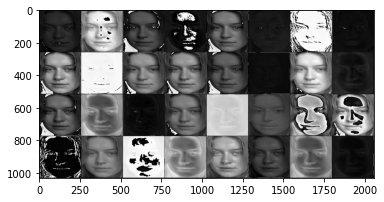

layer 1: Activation function output


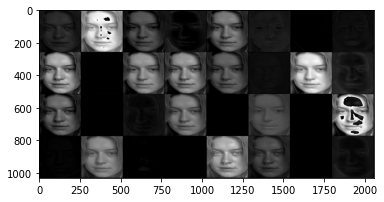

layer 1: Max-Pooling


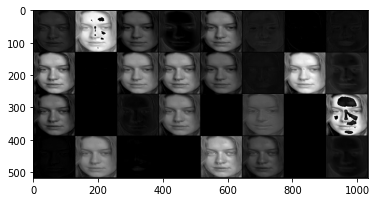

layer 2: Convolution output


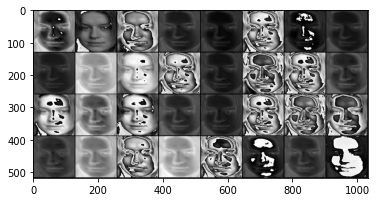

layer 2: Activation function output


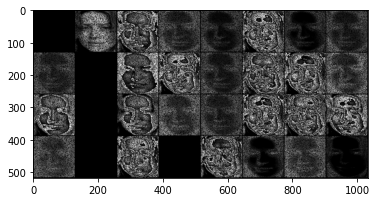

layer 2: Max-Pooling


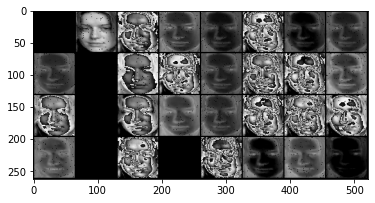

layer 3: Convolution output


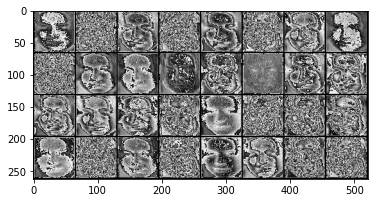

layer 3: Activation function output


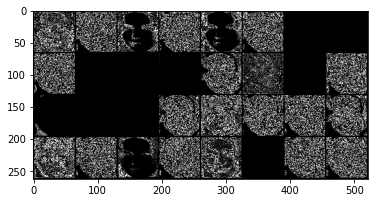

layer 3: Max-Pooling


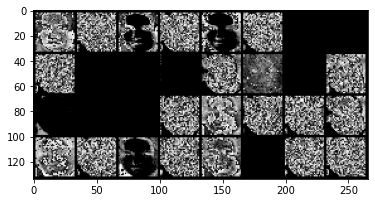

layer 4: Convolution output


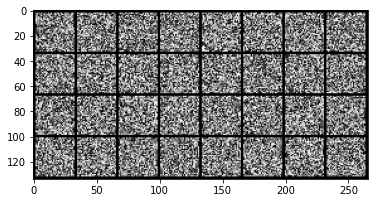

layer 4: Activation function output


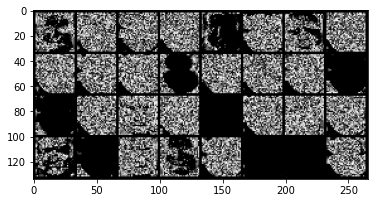

layer 4: Max-Pooling


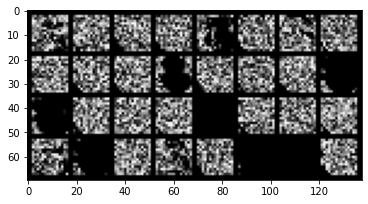

layer 5: Convolution output


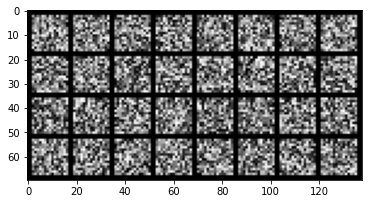

layer 5: Activation function output


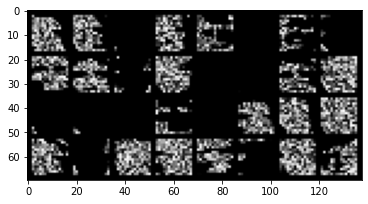

layer 5: Max-Pooling


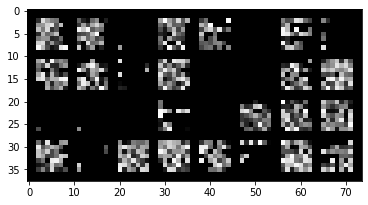

tensor([[ -1.1680,   7.7991, -12.6696,  17.4344,  -2.2748,  13.4559]],
       grad_fn=<AddmmBackward0>)
******************test **************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


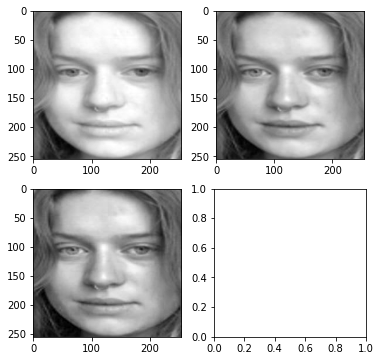

Gender and age group:  male and middle-age .
Prediction is { tensor([3]) } and label is { 0 }


In [ ]:
validar_imagen('img5.jpg')

Prediction and label:  tensor([5])  -  0
layer 1: Convolution output


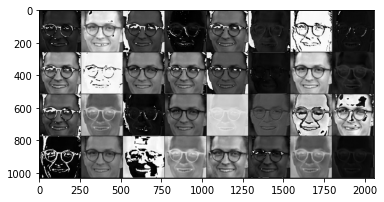

layer 1: Activation function output


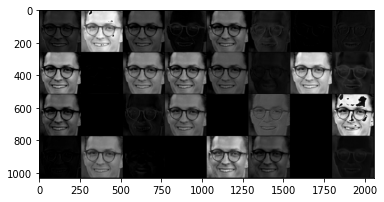

layer 1: Max-Pooling


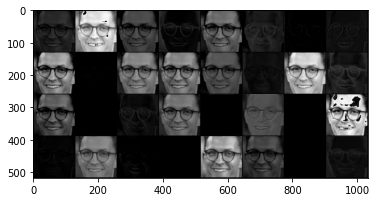

layer 2: Convolution output


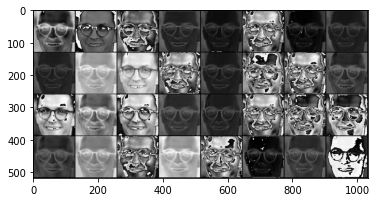

layer 2: Activation function output


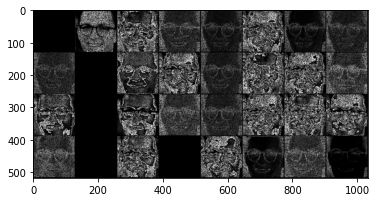

layer 2: Max-Pooling


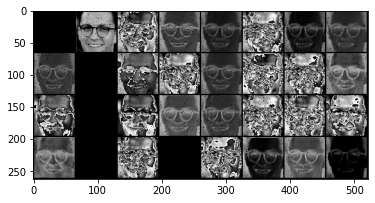

layer 3: Convolution output


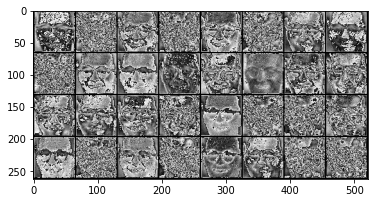

layer 3: Activation function output


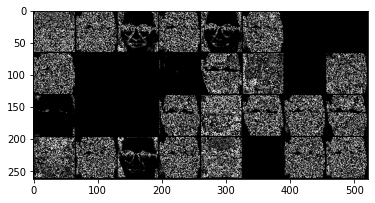

layer 3: Max-Pooling


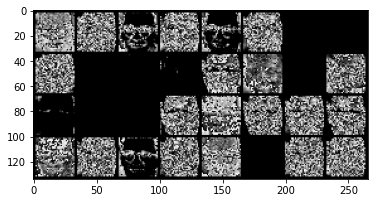

layer 4: Convolution output


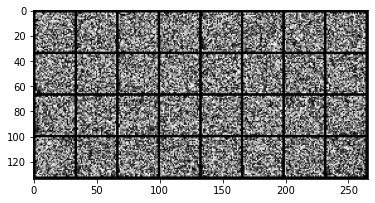

layer 4: Activation function output


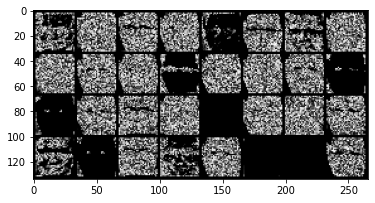

layer 4: Max-Pooling


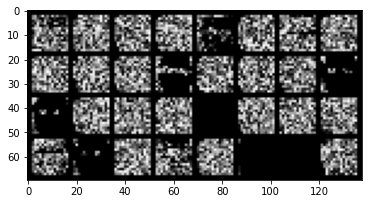

layer 5: Convolution output


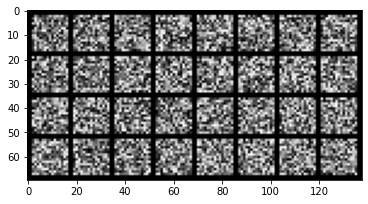

layer 5: Activation function output


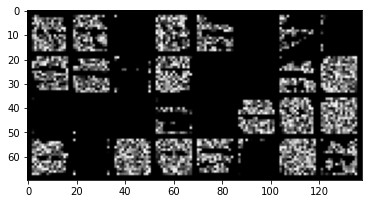

layer 5: Max-Pooling


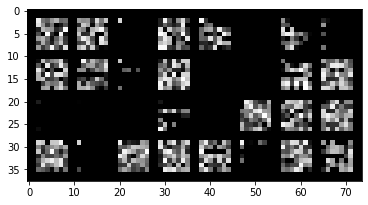

tensor([[ -3.0235,   3.7927, -13.1901,   9.6077,   8.1336,  13.8300]],
       grad_fn=<AddmmBackward0>)
******************test **************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


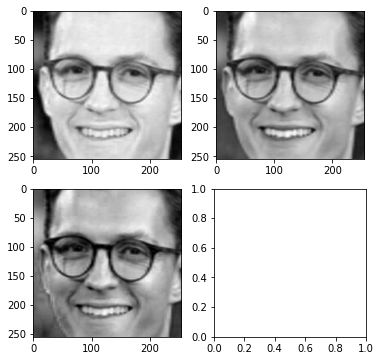

Gender and age group:  male and young .
Prediction is { tensor([5]) } and label is { 0 }


In [ ]:
validar_imagen('img6.jpg')

exotic_test2/0/test3.jpg
Prediction and label:  tensor([4])  -  0
layer 1: Convolution output


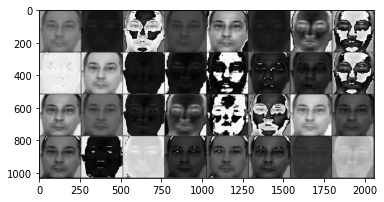

layer 1: Activation function output


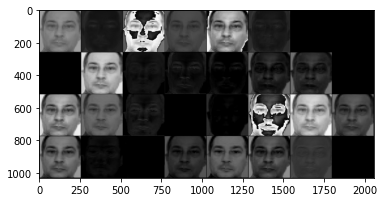

layer 1: Max-Pooling


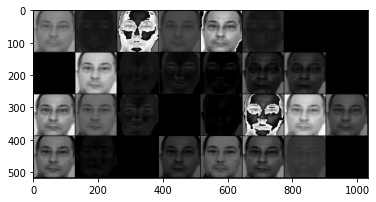

layer 2: Convolution output


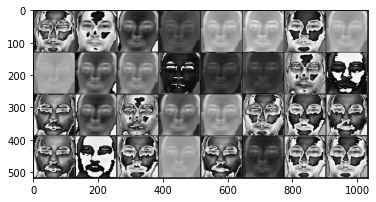

layer 2: Activation function output


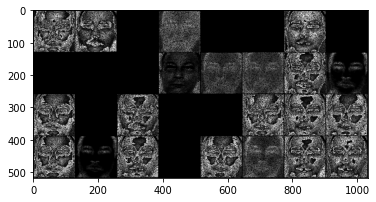

layer 2: Max-Pooling


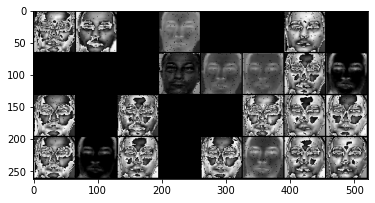

layer 3: Convolution output


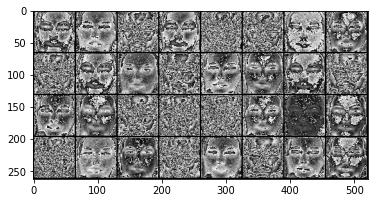

layer 3: Activation function output


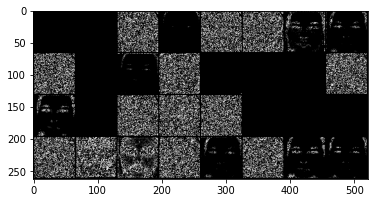

layer 3: Max-Pooling


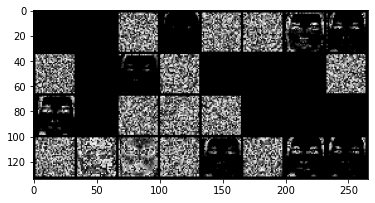

layer 4: Convolution output


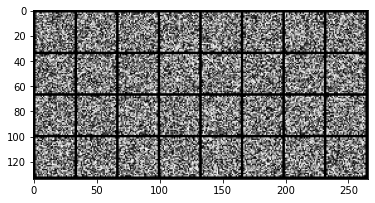

layer 4: Activation function output


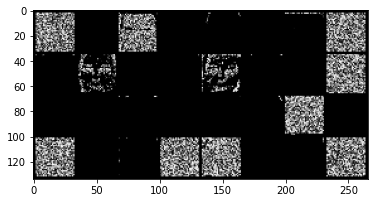

layer 4: Max-Pooling


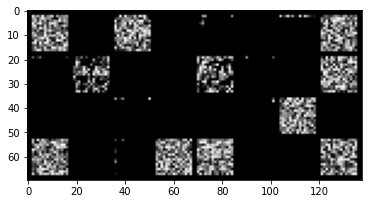

layer 5: Convolution output


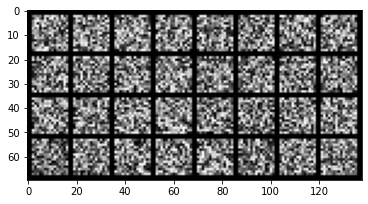

layer 5: Activation function output


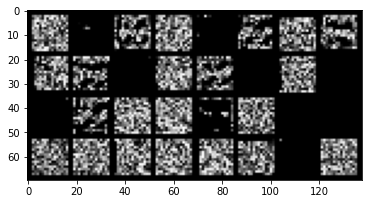

layer 5: Max-Pooling


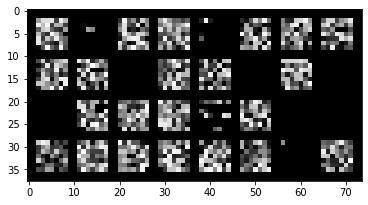

tensor([[-4.3091, -0.3420, -5.8236,  2.1120, 10.4414,  2.5576]])
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


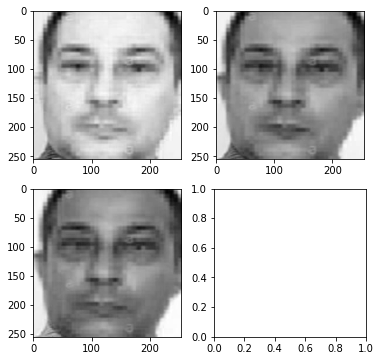

Prediction is { tensor([4]) } and label is { 0 }
Gender and age male and old .


In [ ]:
validar_imagen('test3.jpg')

exotic_test2/0/test4.png
Prediction and label:  tensor([3])  -  0
layer 1: Convolution output


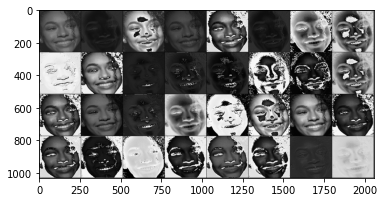

layer 1: Activation function output


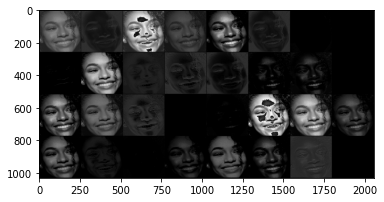

layer 1: Max-Pooling


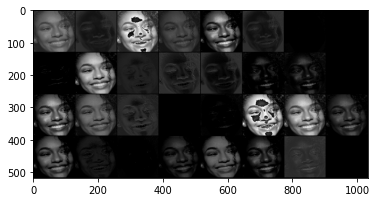

layer 2: Convolution output


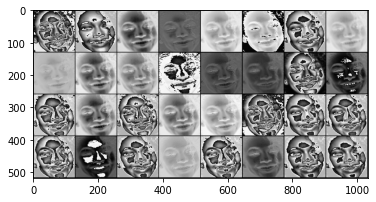

layer 2: Activation function output


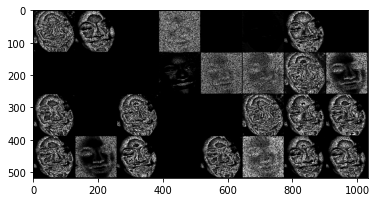

layer 2: Max-Pooling


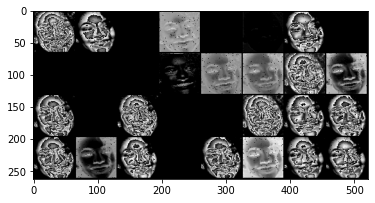

layer 3: Convolution output


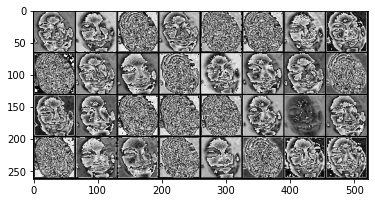

layer 3: Activation function output


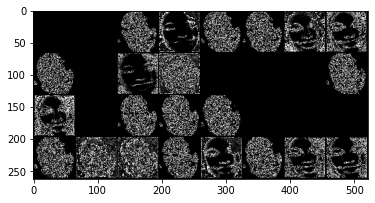

layer 3: Max-Pooling


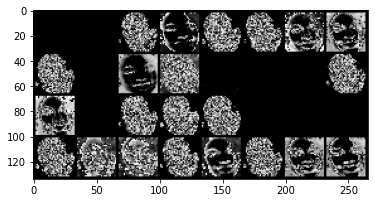

layer 4: Convolution output


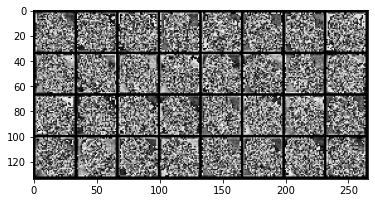

layer 4: Activation function output


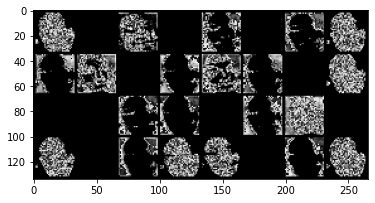

layer 4: Max-Pooling


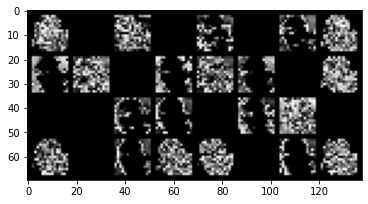

layer 5: Convolution output


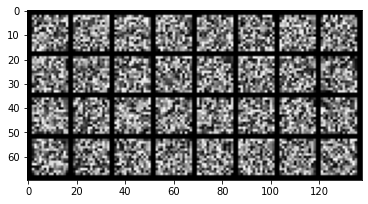

layer 5: Activation function output


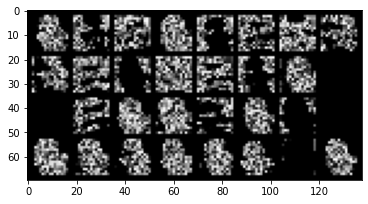

layer 5: Max-Pooling


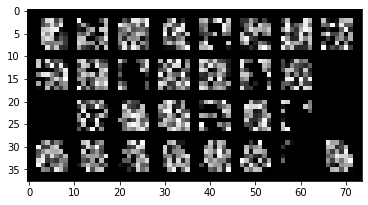

tensor([[  5.4022,  -3.5065, -10.7982,   9.6726,  -2.6621,   5.6751]],
       grad_fn=<AddmmBackward>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


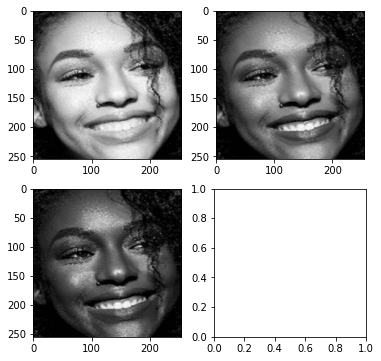

Prediction is { tensor([3]) } and label is { 0 }
Gender and age male and middle-age .


In [ ]:
validar_imagen('test4.png')

exotic_test2/0/testjo5.jpg
Prediction and label:  tensor([2])  -  0
layer 1: Convolution output


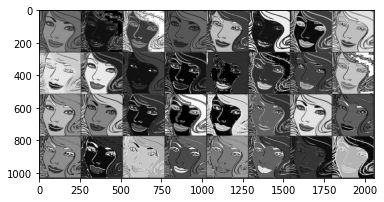

layer 1: Activation function output


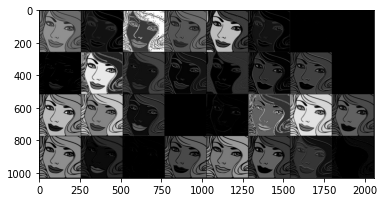

layer 1: Max-Pooling


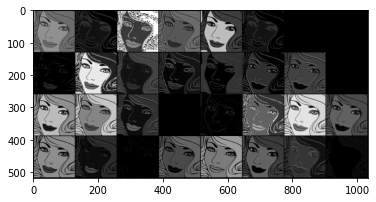

layer 2: Convolution output


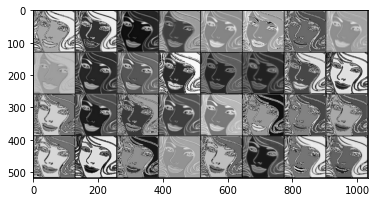

layer 2: Activation function output


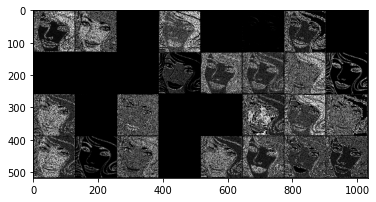

layer 2: Max-Pooling


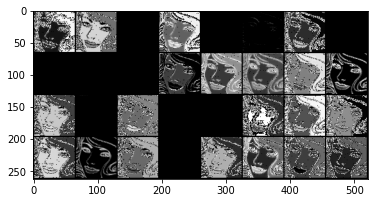

layer 3: Convolution output


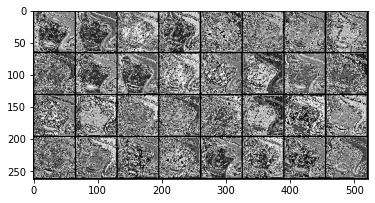

layer 3: Activation function output


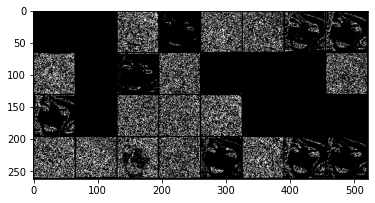

layer 3: Max-Pooling


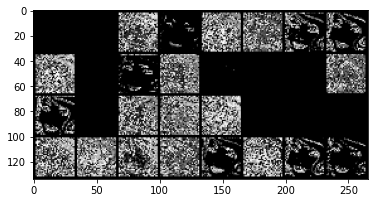

layer 4: Convolution output


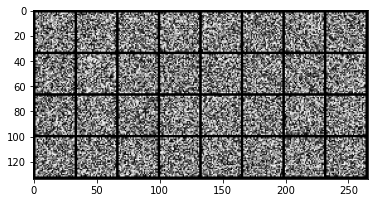

layer 4: Activation function output


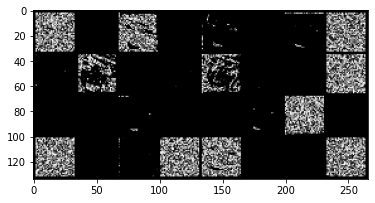

layer 4: Max-Pooling


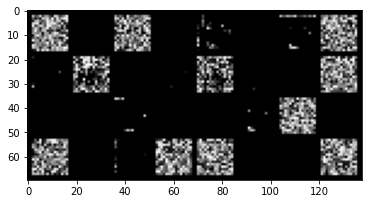

layer 5: Convolution output


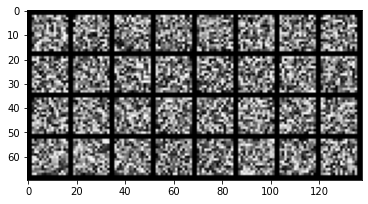

layer 5: Activation function output


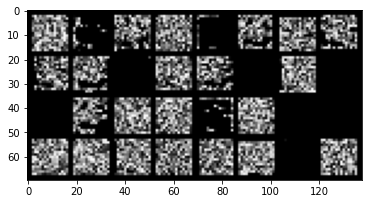

layer 5: Max-Pooling


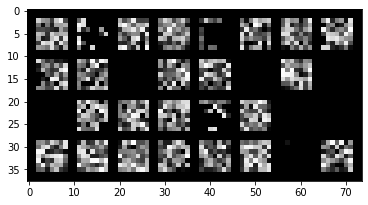

tensor([[-3.3412,  2.9380,  5.0969,  0.6143, -3.2638,  3.8805]],
       grad_fn=<AddmmBackward>)
******************test n° 0**************************


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:62: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.


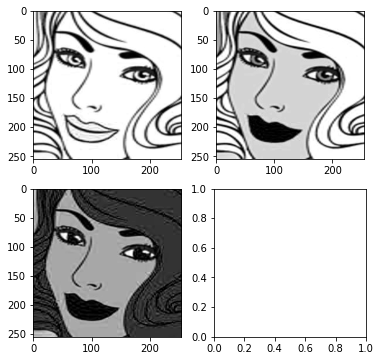

Prediction is { tensor([2]) } and label is { 0 }
Gender and age female and young .


In [ ]:
validar_imagen('dibujo5.jpg')